# Draft – Effect of Atmospheric Heatwaves on Reflectance and Pigment

Composition of Intertidal *Nanozostera noltei* – Draft

Simon Oiry [](https://orcid.org/0000-0001-7161-5246) (Institut des Substances et Organismes de la Mer, ISOMer, Nantes Université, UR 2160, F-44000 Nantes, France)  
Bede Ffinian Rowe Davies (Institut des Substances et Organismes de la Mer, ISOMer, Nantes Université, UR 2160, F-44000 Nantes, France)  
Philippe Rosa (Institut des Substances et Organismes de la Mer, ISOMer, Nantes Université, UR 2160, F-44000 Nantes, France)  
Augustin Debly (Institut des Substances et Organismes de la Mer, ISOMer, Nantes Université, UR 2160, F-44000 Nantes, France)  
Pierre Gernez (Institut des Substances et Organismes de la Mer, ISOMer, Nantes Université, UR 2160, F-44000 Nantes, France)  
Laurent Barillé (Institut des Substances et Organismes de la Mer, ISOMer, Nantes Université, UR 2160, F-44000 Nantes, France)  
October 17, 2024

To be written

# Introduction

Intertidal seagrasses play a crucial role in the ecosystem by providing habitats and feeding grounds for various marine species, supporting rich marine biodiversity, and contributing significantly to primary production and carbon sequestration \[@unsworth2022planetary ; @sousa2019blue\]. These seagrasses are essential in maintaining the health of coastal ecosystems by stabilizing sediments, filtering water, and serving as indicators of environmental changes due to their sensitivity to water quality variations \[@zoffoli2021decadal\]. The interactions between seagrass meadows and their associated herbivores further enhance the delivery of ecosystem services, including coastal protection and fisheries support \[@jankowska2019stabilizing ; @zoffoli2023remote ; @gardner2018global\]. Understanding and preserving these ecosystems are vital for maintaining the biodiversity and productivity of coastal regions \[@scott2018role ; @ramesh2020seagrass\].

Despite their crucial role in marine ecosystems, intertidal seagrasses face numerous threats that compromise their health and functionality. Coastal development and human activities are primary threats. These activities not only reduce the available habitat for seagrasses but also increase water turbidity, which limits light penetration and hampers photosynthesis \[@waycott2009accelerating\]. Seagrasses are also threatened by nutrient enrichment from agricultural and urban runoff, which can lead to eutrophication. This condition promotes the overgrowth of algal blooms that compete with seagrasses for light and nutrients, further stressing these important plants \[@thomsen2023meadow\] (Oiry et al. 2024). Pollution from industrial and agricultural fields sources introduces harmful chemicals and heavy metals into coastal waters, posing toxic risks to seagrass health. These pollutants can affect the physiological processes of seagrasses, reducing their growth and survival rates \[@sevgi2022bitkilerde\] Additionally, invasive species can out compete native seagrasses for resources, altering community structure and function \[@simpson2016distribution\].

Heatwaves, exacerbated by climate change, pose a growing threat to seagrasses. Marine Heatwaves (MHW), defined by @hobday2016hierarchical as prolonged discrete anomalously warm water events, and Atmospheric Heatwaves (AHW), defined by @perkins2013measurement as periods of at least three consecutive days with temperatures exceeding the 90th percentile, cause severe physiological stress on seagrasses \[@sawall2021chronically; @deguette2022physiological\]. At the interface between the land and oceans, intertidal seagrasses are exposed to both MHW and AHW. Heatwaves have profound impacts on seagrasses, with their effects varying based on species and geographic location. For instance, the seagrass *Zostera marina* exhibits high susceptibility to elevated sea surface temperatures during winter and spring, leading to advanced flowering, high mortality rates, and reduced biomass \[@sawall2021chronically\]. Similarly, *Cymodocea nodosa* shows increased photosynthetic activity during heatwaves but suffers negative effects on photosynthetic performance and leaf biomass during recovery \[@deguette2022physiological\]. Additionally, different populations of *Zostera marina* along the European thermal gradient exhibit varied photophysiological responses during the recovery phase of heatwaves, indicating differential adaptation capabilities among populations \[@winters2011effects\]. These events intensify other stressors, such as overgrazing and seed burial, compromising sexual recruitment \[@guerrero2020heat\].

Bleaching and browning events of seagrass beds have been observed following episodes of intense heat along the Brittany coast of France (Pers. obs.) then affecting leaf color, which are expected to alter leaf reflectance. Remote sensing is increasingly being utilized to monitor marine ecosystems, including seagrass meadows. By using spectral indices, such as the Normalized Difference Vegetation Index (NDVI) and the Soil-Adjusted Vegetation Index (SAVI), or by analyzing specific spectral patterns, remote sensing can effectively quantify vegetation health over time \[@huete2012vegetation ; @kloos2021agricultural ; @carlan2020identifying ; @akbar2020mangrove\]. Through the Water Framework Directive and the Marine Strategy Framework Directive, Europe is promoting remote sensing techniques for habitat mapping, as these methods enable the monitoring of extensive areas over time \[@papathanasopoulou2019satellite\]. This study will experimentally test the hypothesis that warm events modify the pigment composition and reflectance of seagrass, linking these changes with satellite remote sensing.

# Material & Methods

## Heatwaves detection and characterisation

### Air temperature

Since January 1, 2024, Meteo France weather data has been freely and openly accessible. Hourly air temperature data (°C) for the French Atlantic and Channel coasts was retrieved using a [custom script](https://github.com/SigOiry/HeatWave_Seagrasses/blob/main/Scripts/MeteoFrance_Extraction.qmd) as no API was available at the time of this study. Weather stations located within 10 kilometers of the coastline were considered, but only those with at least 30 years of data were included to ensure reliable climatological reconstruction. Of the 156 weather stations within 10 kilometers of the coast, only 36 had sufficient data for climatology reconstruction. The hourly data was then aggregated into daily mean temperatures for each station.

Heatwave detection was performed using the HeatwaveR package in R \[@heatwaveR\]. This package utilizes the methodology proposed by @hobday2016hierarchical to detect heatwave events. The climatology for the year was computed using the temperature time series. An event was considered a heatwave each time the temperature exceeded the 90th percentile of the climatology for five consecutive days. The severity of each event has been assessed using the methodology proposed by @hobday2018categorizing.

### Water temperature

\[@CMEMS_1\]

In [ ]:
library(tidyverse)
library(terra)
library(ncdf4)
library(heatwaveR)
library(Utilities.Package)


##### NC opening and processing ######

# Define the path to your NetCDF file
file_path <- "Data/SST/cmems_obs-sst_atl_phy_my_l3s_P1D-m_1729089512246.nc"

# Open the NetCDF file
nc <- nc_open(file_path)

# Display information about the file
print(nc)

# Assuming the temperature variable is named "temperature", replace with the correct name if different
# Get the name of the temperature variable
temp_var_name <- "adjusted_sea_surface_temperature"  # Adjust this according to your file's variable name

# Get the temperature variable
temperature_data <- ncvar_get(nc, temp_var_name)

# Get the time variable
time_data <- ncvar_get(nc, "time")  # Adjust "time" if the name is different

# Calculate the mean temperature across the time dimension (assuming time is the first dimension)
mean_temperature <- apply(temperature_data, 3, mean, na.rm = TRUE) 

# Create a dataframe with time and mean temperature
sst <- data.frame(time = time_data, sst = mean_temperature) %>% 
  mutate(time = as.POSIXct(time, origin="1970-01-01")) 

sst %>% 
  dplyr::filter(!is.nan(as.numeric(mean_temperature))) %>%
ggplot(aes(x = time, y = sst-273.15))+
  geom_point(alpha = 0.3)+
  geom_smooth(method = "glm")


#### HEATWAVE DETECTION ########

df_heatwaveR <- sst %>% 
  rename(t = time,
         temp = sst) %>%
  mutate(t = as.Date(t),
         temp = temp - 273.15) %>% 
  dplyr::select(t,temp) 

  

  clim <- ts2clm(df_heatwaveR, climatologyPeriod = c(min(df_heatwaveR$t), max(df_heatwaveR$t)))
  
  event <- detect_event(clim,categories = T,minDuration = 3)
  
  res <- detect_event(clim, minDuration = 3)
  mhw <- res$clim
  
  mhw %>%
    filter(t> as.Date("2021-07-15") & t < as.Date("2021-10-15") ) %>%
ggplot(aes(x = t, y = temp))+
    geom_line() +
    geom_point()+
    geom_flame(aes(y2 = thresh))+
    geom_line(aes(y = thresh), color = "darkred")+
    theme_Bede()

## Experiment

### Sampling and acclimation of seagrasses

Seagrass was sampled from a *Nanozostera noltei* (dwarf eelgrass, syn. *Zostera noltei*) meadow on Noirmoutier Island, France (46°57’32.0”N 2°10’37.0”W) at low tide in June 2024. A home-made inox sampling box was used to sample seagrass from an area of 30 cm by 15 cm and 5 cm deep, maintaining the sediment structure and avoiding damage to the rhizomes and the leafs of the seagrass (@fig-design A). This sampling box allowed to limitate sampling variability between replicates. The seagrass, along with sediment, meiofauna, and macrofauna, was placed in plastic trays. To avoid hydric stress during transportation, seawater was added to each tray. Simultaneously, seawater was sampled from a nearby site and transported to the lab, where it was filtered using a 0.22 µm nitrocellulose filter to remove all suspended particulate matter. This seawater was used in the acclimation tank and the intertidal chambers. The seagrasses were acclimated at high tide for one weeks with a water temperature of 17°C, matching the temperature at the time of sampling, and with light of 150 µmol.s-1.m-2 of PAR photons \[@akbar2020mangrove\]. A wave generator was used in the tank to circulate and reoxygenate the water.

### Experimental design

In [ ]:
library(tidyverse)
library(tidyterra)
library(terra)

get_letter_position <- function(img){
  
  ext <- ext(img)
  
  x <- as.numeric(ext[1]+(0.05*(ext[2]-ext[1])))
  y <- as.numeric(ext[3]+(0.95*(ext[4]-ext[3])))

  
  return(c(ext[1]+0.1, ext[4]-0.1))
}



A <- rast("Data/imgs/Simon_Sampling.png") 
ext(A) <- c(0,0.975,-1.95,0)

B <- rast("Data/imgs/Chamber.jpg") 
ext(B) <- c(1.025,2,-1.95,0)

D <- rast("Data/imgs/Seagrass_before_zoomed.png")
ext(D) <- c(2.05,3.025,-1.4625,0)

C <- rast("Data/imgs/Tray_high.jpg") 
ext(C) <- c(0,2,-2.975,-2)

E <- rast("Data/imgs/Seagrass_after_zoomed.png")
ext(E) <- c(2.05,3.025,-2.975,-1.5125)

letter_A <- get_letter_position(A)
letter_B <- get_letter_position(B)
letter_C <- get_letter_position(C)
letter_D <- get_letter_position(D)
letter_E <- get_letter_position(E)

letter_size <- 3

plot <- ggplot()+
  geom_spatraster_rgb(data = A, maxcell = 20e+05)+
  geom_spatraster_rgb(data = B, maxcell = 20e+05)+
  geom_spatraster_rgb(data = C, maxcell = 20e+05)+
  geom_spatraster_rgb(data = D, maxcell = 20e+05)+
  geom_spatraster_rgb(data = E, maxcell = 20e+05)+
  coord_equal()+
  geom_label(aes(x = letter_A[1],y=letter_A[2], label = "A"), alpha = 0.5, size = letter_size)+
  geom_label(aes(x = letter_B[1],y=letter_B[2], label = "B"), alpha = 0.5, size = letter_size)+
  geom_label(aes(x = letter_C[1],y=letter_C[2], label = "C"), alpha = 0.5, size = letter_size)+
  geom_label(aes(x = letter_D[1],y=letter_D[2], label = "D"), alpha = 0.5, size = letter_size)+
  geom_label(aes(x = letter_E[1],y=letter_E[2], label = "E"), alpha = 0.5, size = letter_size)+
  theme_void()+
  theme(axis.text = element_blank(), 
        axis.title = element_blank(), 
        axis.ticks = element_blank(), 
        axis.ticks.length = unit(0, "pt"),
        panel.grid.major=element_blank(), 
        panel.grid.minor=element_blank(), 
        plot.margin = margin(0, 0, 0, 0, "pt"))

ggsave("Paper/Figs/Experimental_design.png",plot, width = 3.025, height = 2.975, dpi = 800)

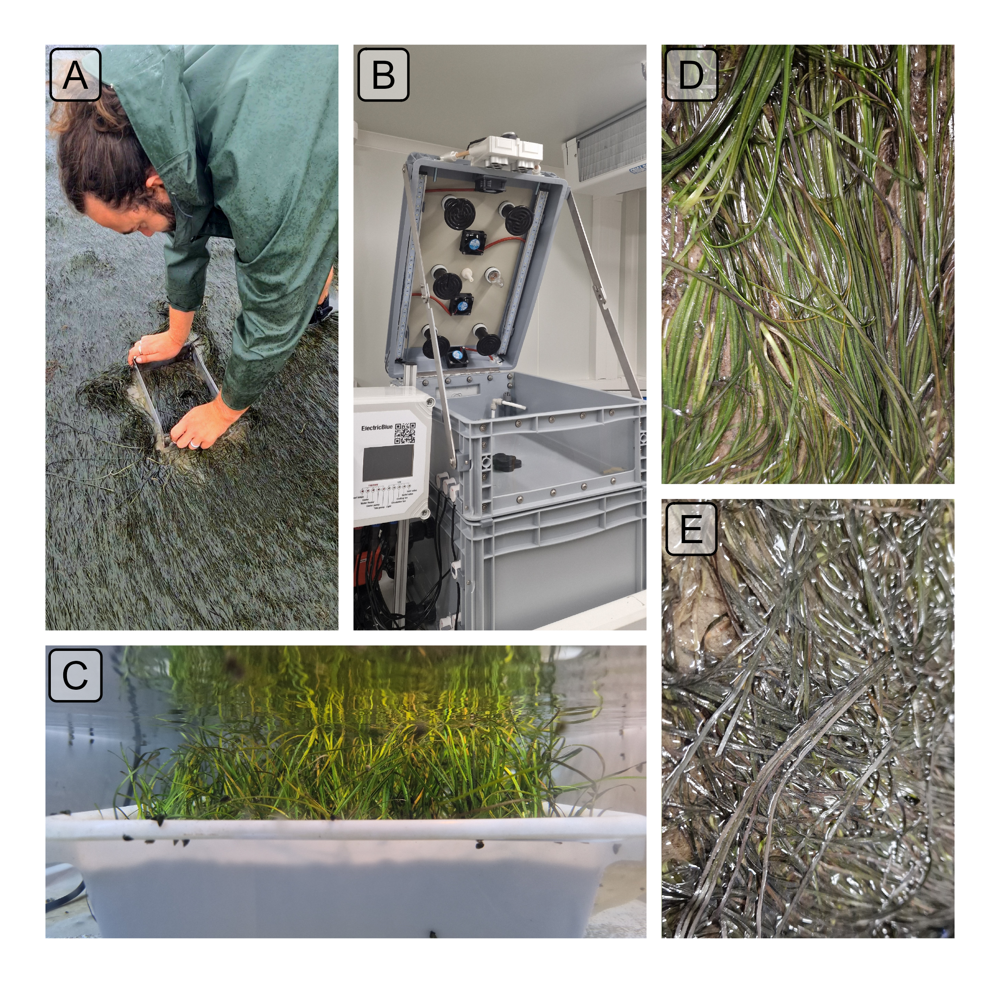

In [ ]:
knitr::include_graphics("Figs/Experimental_design.png")

Two intertidal chambers from [ElectricBlue](https://electricblue.eu/intertidal-chamber) were used to simulate tidal cycles and control water temperature during high tide and air temperature during low tide (@fig-design B,C). One chamber served as the control, while the other was used for the experimental treatment. The control chamber was maintained at temperatures representative of the typical seasonal conditions: water temperatures between 18°C and 19°C and air temperatures between 18°C and 23°C, following circadian temperature variability (@fig-Profile left). For the experimental treatment, the air temperature was set to mimic an atmospheric heatwave that occurred over the seagrass meadow of Porh Saint-Guénël, Plouharnel, France (47°35’40.0”N, 3°07’30.0”W) from August 26, 2021, to September 6, 2021. On the first day of the experiment, air temperatures in the experimental chamber were set to range from 23°C at night to 35°C during the day, with a daily increase of 1°C. The water temperature in the experimental chamber was similarly adjusted to reflect the heatwave conditions, starting from the normal seasonal range (18°C) and gradually increasing to simulate the rising temperatures experienced during the heatwave (+0.5°C daily). This setup aimed to replicate the thermal stress experienced by the seagrass meadow during the actual heatwave event (@fig-Profile right).

In [ ]:
library(MapRs)
library(tidyverse)
library(Utilities.Package)
library(patchwork)

experimental_design <- Make_Chamber_Profile(min_Air_Temp_control = 19,
                                            max_Air_Temp_control = 23,
                                            min_Air_Temp_test = 23,
                                            max_Air_Temp_test = 35,
                                            min_Water_Temp_control= 18, 
                                            max_Water_Temp_control = 18,
                                            min_Water_Temp_test = 18,
                                            max_Water_Temp_test = 18,
                                            date_start = "2024-07-22 21:00:00",
                                            date_end = "2024-07-26 23:00:00",
                                            low_tide_time = "2024-07-23 12:00:00",
                                            High_Tide_Until = "2024-07-24 09:00:00",
                                            daily_increase_Air_Test = 1,
                                            daily_increase_Water_Test = 0.5,
                                            daily_increase_Air_Control = 0,
                                            daily_increase_Water_Control = 0,
                                            sunrise = 6.25,
                                            sunset = 22,
                                            max_light_intensity = 120,
                                            export_profile = F,
                                            Tide = "both",
                                            night_tide = T,
                                            time_step = 60, 
                                            Save_Experiment = F, 
                                            Experiment_Name = "HW5_24072024_to_26072024")

df_control <- experimental_design$Control_df %>% 
  dplyr::filter(Time > as.POSIXct("2024-07-24 00:00:00", format = "%Y-%m-%d %H:%M", tz = "UTC")) %>% 
  dplyr::mutate(scenario = "Control")
df_test <- experimental_design$Test_df %>% 
  dplyr::filter(Time > as.POSIXct("2024-07-24 00:00:00", format = "%Y-%m-%d %H:%M", tz = "UTC")) %>% 
  dplyr::mutate(scenario = "Test")

df <- df_control %>% 
  bind_rows(df_test)

polygon_table <-   df %>% 
  group_by(tide_ID) %>% 
  reframe(Tide_Status = unique(Tide_Status), 
          xmin = min(Time),
          xmax = max(Time),
          T_min = min(Temp_Air,Temp_Water),
          T_max = max(Temp_Air,Temp_Water)) %>% 
  ungroup() %>% 
  mutate( ymin = min(T_min),
          ymax = max(T_max)) %>% 
  rename(Tide = Tide_Status) %>% 
  mutate(Tide = case_when(Tide == "High_Tide" ~ "High Tide",
                          TRUE ~ "Low Tide"))

#### Test
water_polyline_test <- df %>% 
  dplyr::filter(scenario == "Test") %>% 
  dplyr::filter(Tide_Status == "High_Tide") 

air_polyline_test <- df %>% 
  dplyr::filter(scenario == "Test") %>% 
  dplyr::filter(Tide_Status == "Low_Tide")

max_air_temp_test <- df %>% 
  dplyr::filter(scenario == "Test") %>% 
  dplyr::filter(Tide_Status == "Low_Tide") %>% 
  group_by(tide_ID) %>% 
  dplyr::filter(Temp == max(Temp)) %>% 
  dplyr::filter(Temp >=35)

  cols_fill <- c("High Tide" = "gray1", "Low Tide" = "gray50")
  cols_col <- c("Air Temperature" = "red4", "Water Temperature" = "blue3")



plot_treatment <- df %>% 
  dplyr::filter(scenario == "Test") %>% 
ggplot()+
  geom_line(aes(x = Time, y = Temp))+
  geom_rect(data = polygon_table , aes(ymin = 18, ymax = 39, xmin = xmin, xmax =xmax, fill = Tide, group = tide_ID),alpha = 0.1,show.legend = F) +
  geom_line(data = df  %>% 
    dplyr::filter(Time > as.POSIXct("2024-07-24 09:00:00", format = "%Y-%m-%d %H:%M", tz = "UTC")) %>% 
    dplyr::filter(scenario == "Test"),
    aes(x = Time, y = Temp_Water, color = "Water Temperature"), linewidth = 1, linetype = "dashed", alpha = 0.3,show.legend = F)+
  geom_line(data = water_polyline_test, aes(x = Time, y = Temp, group = tide_ID, color = "Water Temperature"), linewidth = 1,show.legend = F)+
    scale_x_datetime(date_breaks = "6 hour", date_labels = "%H:%M") +
  geom_line(aes(x = Time, y = Temp_Air, color = "Air Temperature"), linewidth = 1, linetype = "dashed", alpha = 0.3,show.legend = F)+
  geom_line(data = air_polyline_test, aes(x = Time, y = Temp, group = tide_ID, color = "Air Temperature"),, linewidth = 1,show.legend = F)+
    geom_text(data = data.frame(x = as.POSIXct("2024-07-24 03:00:00", format = "%Y-%m-%d %H:%M", tz = "UTC"), y = 38.5, label = "Treatment"), aes( x = x, y =y , label = label), hjust = 0, size = 10)+
    scale_fill_manual(name = "legend",
                      values = cols_fill) +
    scale_color_manual(name = "legend",
                       values = cols_col) +
   ggforce::geom_mark_ellipse(data=max_air_temp_test,
                 aes(x=Time,
                     y=Temp,
                     x0 = Time, 
                     y0 = Temp + 1,
                     label = paste0(Temp, " °C"),
                     group = tide_ID),
                     # description=Description),
                 size=0.3,
                 fill = "goldenrod",
                 con.colour = "goldenrod4",
                 show.legend=F,
                 label.fontsize = 25,
                 label.hjust = 0.5,
                 con.size = 2,
                 alpha=0.8,
  expand = unit(2, "mm") , 
  radius = unit(2, "mm") ,
  label.fill = NA,
  label.buffer = unit(5, "mm"))+
  ylab("Temperature (°C)")+
  ylim(c(18,39))+
  scale_y_continuous(position = "right") +
  theme_Bede()+
    theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 0.6),
          axis.text.y = element_text(size = 25),
          axis.title.x = element_text(size = 30),
          axis.title.y = element_text(size = 30))

### Control 
water_polyline_control <- df %>% 
  dplyr::filter(scenario == "Control") %>% 
  dplyr::filter(Tide_Status == "High_Tide") 

air_polylines_control <- df %>% 
  dplyr::filter(scenario == "Control") %>% 
  dplyr::filter(Tide_Status == "Low_Tide")

max_air_temp_control <- df %>% 
  dplyr::filter(scenario == "Control") %>% 
  dplyr::filter(Tide_Status == "Low_Tide") %>% 
  group_by(tide_ID) %>% 
  dplyr::filter(Temp == max(Temp)) %>% 
  dplyr::filter(Temp >=20)

  # cols_fill <- c("High Tide" = "gray30", "Low Tide" = "gray90")
  # cols_col <- c("Air Temperature" = "red4", "Water Temperature" = "blue3")




plot_control <- df %>% 
  dplyr::filter(scenario == "Control") %>% 
  ggplot()+
    geom_line(aes(x = Time, y = Temp),alpha = 0.2, linewidth = 1)+
    geom_rect(data = polygon_table , aes(ymin = 18, ymax = 39, xmin = xmin, xmax =xmax, fill = Tide, group = tide_ID),alpha = 0.1) +
    geom_line(data = df  %>% 
      dplyr::filter(Time > as.POSIXct("2024-07-24 09:00:00", format = "%Y-%m-%d %H:%M", tz = "UTC")) %>% 
      dplyr::filter(scenario == "Control"),
      aes(x = Time, y = Temp_Water, color = "Water Temperature"), linewidth = 1, linetype = "dashed", alpha = 0.3)+
    geom_line(data = water_polyline_control, aes(x = Time, y = Temp, group = tide_ID, color = "Water Temperature"), linewidth = 1)+
    scale_x_datetime(date_breaks = "6 hour", date_labels = "%H:%M") +
    geom_line(aes(x = Time, y = Temp_Air, color = "Air Temperature"), linewidth = 1, linetype = "dashed", alpha = 0.3)+
    geom_line(data = air_polylines_control, aes(x = Time, y = Temp, group = tide_ID, color = "Air Temperature"), linewidth = 1)+
    geom_text(data = data.frame(x = as.POSIXct("2024-07-24 03:00:00", format = "%Y-%m-%d %H:%M", tz = "UTC"), y = 38.5, label = "Control"), aes( x = x, y =y , label = label), hjust = 0,size = 10)+
    ggforce::geom_mark_ellipse(data=max_air_temp_control,
                   aes(x=Time,
                       y=round(Temp,0),
                       x0 = Time, 
                       y0 = Temp + 1,
                       label = paste0(round(Temp,0), " °C"),
                       group = tide_ID),
                       # description=Description),
                   size=0.3,
                   fill = "goldenrod",
                   con.colour = "goldenrod4",
                   show.legend=F,
                   label.fontsize = 25,
                   label.hjust = 0.5,
                   con.size = 2,
                   alpha=0.8,
    expand = unit(2, "mm") , 
    radius = unit(2, "mm") ,
    label.fill = NA,
    label.buffer = unit(5, "mm"))+
    scale_fill_manual(name = "legend",
                      values = cols_fill) +
    scale_color_manual(name = "legend",
                       values = cols_col) +
  ylab("Temperature (°C)")+

    ylim(c(18,39))+
    theme_Bede()+
    theme(legend.position = c(0.16,.8),
          legend.background = element_rect(fill=scales::alpha('white', 0.8)),
          legend.text = element_text(size = 20, hjust = 0),
          legend.title = element_blank(),
          legend.key.size = unit(0.7,"cm"),
          legend.spacing = unit(0,"mm"),
          axis.text.x = element_text(size = 25,angle = 45, vjust = 0.6),
          axis.text.y = element_text(size = 25),
          axis.title.x = element_text(size = 30),
          axis.title.y = element_text(size = 30))


plt <- plot_control + plot_treatment

ggsave("Paper/Figs/Chamber_Profils.png",plt, height = 874*4, width = 1911*4, unit= "px")

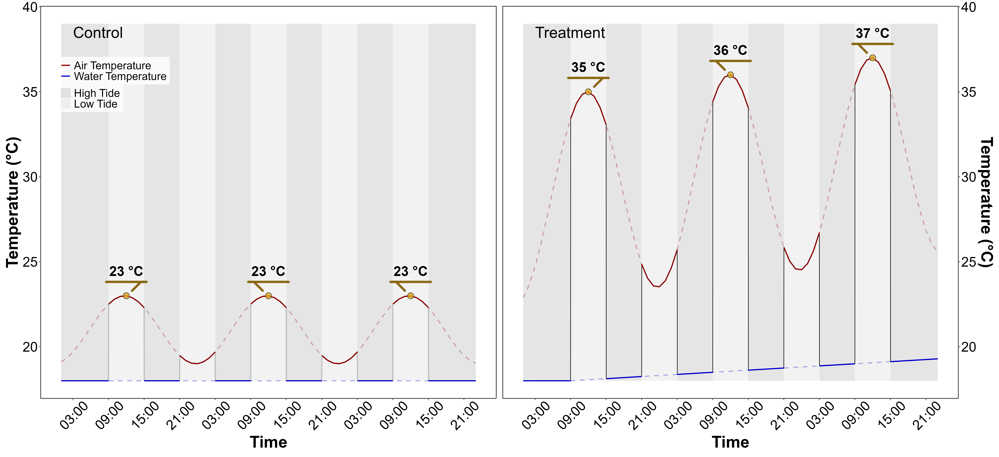

In [ ]:
knitr::include_graphics("Figs/Chamber_Profils.png")

### Measurement and sampling

#### Hyperspectral measurement

Throughout the experiment, hyperspectral signatures of both the control and treatment seagrasses were taken using an ASD HandHeld 2 equipped with a fiber optic, allowing measurements to be taken directly inside the chamber without opening it. Automatic spectra acquisition has been done using the [RS3 softaware](https://www.malvernpanalytical.com/en/learn/knowledge-center/user-manuals/rs3-software-user-manual) developed by the intrument manufacturer. An average of five reflectance spectrum ($R(\lambda)$), each with an integration time of 544 ms, was taken every minute. Every 10 minutes, the fiber optic was switched from one benthic chamber to the other, in order to measure reflectance in both treatment and control. Because light conditions were controlled inside of the chambers, reflectance calibration of the instrument was performed only each morning at the very first moment of low tide using a Spectralon white reference with 99% Lambertian reflectivity.

The second derivative of $R$ was calculated to retrieve absorption features and compare their variability over time. Two radiometric indices were also monitored throughout the experiment :

-   The Normalized Difference Vegetation Index (NDVI, @rouse1974monitoring), as a proxy of the concentration of chlorophyll-a (@eq-ndvi)

$$
NDVI = \frac{R(840)-R(668)}{R(840)+R(668)}
$$ {#eq-ndvi}

where $R(840)$ and $R(668)$ are the reflectance at 840 nm and 668 nm respectively.

-   The Green Leaf Index (GLI, @louhaichi2001spatially), as a measurement of the greenness of seagrass leafs (@eq-gli)

$$
GLI = \frac{[R(550)-R(668)]+[R(550)-R(450)]}{(2 \times R(550) )+ R(668) + R(450) }
$$ {#eq-gli}

where $R(550)$ and $R(450)$ are the reflectance in green at 550 nm and in the blue at 450 nm, respectively.

-   The Mid-Infrared Water Absorption Index (MIWAI), proposed here and designed to measure water absorption at 970 nm (**REF**), estimates the difference between the reflectance at 970 nm and a linear interpolation of the reflectance values at 950 and 990 nm. This interpolation represents the expected reflectance value in the absence of water.

$$
MIWAI = 0.5 \times [R(990)+R(950)]-R(970)
$$ {#eq-MIWAI}

where $R(990)$, $R(970)$ and $R(950)$ are the reflectance in the infrared at 990, 970 and 950 nm, respectively.

> #### Multispectral imagery measurement
>
> Parallel to hyperspectral measurements, multispectral images were taken at the beginning and end of each diurnal low tide (09:00 am and 03:00 pm). A Micasense RedEdge-MX Dual multispectral camera, originally designed to be mounted on a drone, was modified for use without a drone. A 3D-printed mount was designed to attach the camera to the intertidal chamber and ensure that each picture was captured under the same conditions. At each time step (09:00 am and 03:00 pm), a first picture of the Spectralon was taken to allow for image correction in reflectance, followed by a second picture of the target. [DISCOV](https://sigoiry.github.io/DISCOV-MicaSense/), a Neural Network classification model previously developed to map intertidal vegetation using drone imagery, has been applied to each image taken inside the intertidal chambers. To understand the behavior of the model on seagrasses affected by heatwaves, classification images from before and after the heatwave have been compared.

#### Leaves sampling and HPLC measurement

At the beginning and the end of each diurn low tide (09:00 am and 03:00 pm) leaves samples have been took in both the test and the control. leaves sampled have been stored under -80°C waiting for analysis. Pigment composition and biomass were analyzed using high-performance liquid chromatography (HPLC). The HPLC system (Alliance HPLC 248 System, Waters) was equipped with a reverse-phase C-18 separating column (SunFire C-18 Column, 100Å, 3.5 µm, 2.1 mm x 50 mm, Waters), preceded by a precolumn (VanGuard 3.9 mm x 5 mm, Waters). The system also included a photodiode array detector (2998 PDA) and a fluorimeter (Ex: 425 nm, Em: 655 nm; RF-20A, SHIMADZU).

**Au secours Philippe !!!**

# Bibliography